# **MGT-415: Project**

- Bouraux Léopold - 257368
- Debains Gaspard - 258434
- De la Fage Jean-Baptiste - 247104
- Méhaignerie Gabriel - 262513
- Trébaol Tristan - 259059
- Villegas Alfonso - 262765

Map visualization tutorials:  [#1](https://towardsdatascience.com/mapping-geograph-data-in-python-610a963d2d7f) [#2](https://towardsdatascience.com/a-complete-guide-to-an-interactive-geographical-map-using-python-f4c5197e23e0)

### 1. Imports, setup, downloading data
### 2. Preprocessing
### 3. Exploratory Data Analysis & Visualization of the geographical data 

_____
_____

### **1. Imports, setup, downloading data**

**Install Python Libraries, initialize settings and mount google drive repository**

In [1]:
!pip install pyshp
!pip install geopandas
!pip install chart_studio

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd
import shapefile as shp
import seaborn as sns
import geopandas as gpd
import json, bokeh, datetime, chart_studio.plotly
import plotly.graph_objs as go
import plotly.offline as pyo
import warnings

from plotly.offline import iplot
from collections import Counter
from bokeh.io import output_notebook, output_file
from bokeh.plotting import figure, show
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool, Plot, Range1d, BasicTickFormatter, LinearAxis, LogTicker, FixedTicker, FuncTickFormatter
from bokeh.palettes import brewer
from IPython.display import set_matplotlib_formats

In [3]:
sns.set(style="whitegrid", palette="pastel", color_codes=True)
sns.mpl.rc("figure", figsize=(10,6))
set_matplotlib_formats('retina')
warnings.filterwarnings('ignore')
%matplotlib inline
output_notebook()
pyo.init_notebook_mode()

Loading BokehJS ...

In [4]:
#from google.colab import drive
#drive.mount('/content/gdrive')

path_leo = 'gdrive/My Drive/COLABS/MGT-415/Project/'
path_leo2 = ''

PATH_ROOT =  path_leo2 #change dir to your project folder
DATA_ROOT = PATH_ROOT+'data/'

**Load csv files**

Our dataset contains two csv files, which contain crimes data, as well as 4 others files which contains geographical data. It will be useful for visualization. The first dataset contains desccription of each crime, let's explore it:

In [5]:
crime_codes = pd.read_csv(DATA_ROOT+"MO_Codes.csv") 
crime_data = pd.read_csv(DATA_ROOT+"Crime_Data_2010_2017.csv") 

___
### **2. Preprocessing**

Let's explore the first dataset called ```crime_codes```:

In [6]:
crime_codes.sample(2)

,MO_Code,Description
124,381,Suspect apologizes
242,548,Suspect gives victim douche/enema


In [7]:
for i in range(len(crime_codes)):
    print('•', crime_codes['Description'].loc[i], end=' ')
print('\nTotal number:', len(crime_codes))

• Suspect Impersonate • Aid victim • Blind • Crippled • Customer • Delivery • Doctor • God • Infirm • Inspector • Involved in traffic/accident • Police • Renting • Repair Person • Returning stolen property • Satan • Salesman • Seeking someone • Sent by owner • Social Security/Medicare • DWP/Gas Company/Utility worker • Contractor • Gardener/Tree Trimmer • Suspect wore disguise • Bag • Cap/hat • Cloth (with eyeholes) • Clothes of opposite sex • Earring • Gloves • Handkerchief • Halloween mask • Mask • Make up (males only) • Shoes • Nude/partly nude • Ski mask • Stocking • Unusual clothes • Suspect wore hood/hoodie • Uniform • Wig • Mustache-Fake • Suspect wore motorcycle helmet • Escaped on (used) transit train • Aimed gun • Ambushed • Ate/drank on premises • Attacks from rear • Crime on upper floor • Defecated/urinated • Demands jewelry • Drive-by shooting • Got victim to withdraw savings • Graffiti • Gun in waistband • Hid in building • Hot Prowl • Jumped counter/goes behind counter •

We've got a lot of categories (532), they seem very specific and plenty of them are weird (God, Satan, ...). That's not going to help us in our final goal. Moreover, in the main dataset, some crimes don't have MO_Code, and it seems that there is a broader category (```Crime Code Description```)
describing the type of crimes.
Let's explore it instead of the first ```MO_Codes```dataset.

In [8]:
crime_data["Crime Code Description"].value_counts()

BATTERY - SIMPLE ASSAULT              145767
VEHICLE - STOLEN                      121329
BURGLARY FROM VEHICLE                 121318
BURGLARY                              114751
THEFT PLAIN - PETTY ($950 & UNDER)    113709
                                       ...  
ABORTION/ILLEGAL                           3
MANSLAUGHTER, NEGLIGENT                    3
TILL TAP - ATTEMPT                         2
DRUNK ROLL - ATTEMPT                       1
TRAIN WRECKING                             1
Name: Crime Code Description, Length: 134, dtype: int64

The categories seem more reasonable, there are fewer (134) of them and they are more understandable. However, there are still some missing values:

In [9]:
FT_na = crime_data["Crime Code Description"].isna().value_counts()
FT_na[1]/(FT_na[0]+FT_na[1])

0.00026004913161263284

The proportion of missing values in this column is negligible ==> 0.02 %. 
We are therefore deleting crimes with missing descriptions.


In [10]:
crime_data = crime_data[crime_data["Crime Code Description"].notna()]

Then we're only going to use this last dataset. Let's take a closer look at what it looks like:

In [11]:
crime_data.sample(2)

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,...,Weapon Description,Status Code,Status Description,Crime Code 1,Crime Code 2,Crime Code 3,Crime Code 4,Address,Cross Street,Location
962514,141909835,04/12/2014,04/11/2014,2340,19,Mission,1902,626,INTIMATE PARTNER - SIMPLE ASSAULT,2000 1813 0444 0429,...,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,626.0,NaN,NaN,NaN,13700 GLENOAKS BL,NaN,"(34.3205, -118.4664)"
932193,141520121,11/06/2014,11/06/2014,2020,15,N Hollywood,1512,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",0344,...,NaN,AA,Adult Arrest,341.0,NaN,NaN,NaN,7000 BELLAIRE AV,NaN,"(34.1976, -118.4094)"


In [12]:
crime_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1583904 entries, 0 to 1584315
Data columns (total 26 columns):
DR Number                 1583904 non-null int64
Date Reported             1583904 non-null object
Date Occurred             1583904 non-null object
Time Occurred             1583904 non-null int64
Area ID                   1583904 non-null int64
Area Name                 1583904 non-null object
Reporting District        1583904 non-null int64
Crime Code                1583904 non-null int64
Crime Code Description    1583904 non-null object
MO Codes                  1412160 non-null object
Victim Age                1455303 non-null float64
Victim Sex                1438706 non-null object
Victim Descent            1438673 non-null object
Premise Code              1583828 non-null float64
Premise Description       1581154 non-null object
Weapon Used Code          524607 non-null float64
Weapon Description        524606 non-null object
Status Code               1583902 non-nul

**Columns to delete**

As we just saw, we can delete columns concerning Crime Description execpt the one we used. Then we delete ```•Crime Code •MO Codes •Crime Code 1 •Crime Code 2 •Crime Code 3 •Crime Code 4```. 

We notice that some columns could be deleted. This is the case of ```•DR Number``` which represents a code that is unique to each cell. As we are interested in a set of cases but not in some in particular, this data is irrelevant to us.

The ```•Area ID •Area Name``` columns are also irrelevant since our geographical datasets take into account only the ```Reporting District```.

The ```•Address •Cross Street``` columns are difficult to handle, we will prefer the ```Location column```.

The ```•Date Reported``` column can be deleted, since we want to predict crimes in the future, then this data will not help us.
 
However, some columns are ambiguous and deserve further exploration to decide if they are worth it. This is the instance for:


1. Victim Descent: the origin of the victim
2. Premise Description: a brief description of where the crime occured
3. Premise Code: a code to describe the same thing --> **to delete**
4. Weapon Description: a brief description of the weapon if there is any
5. Weapon Used Code: a code to describe the same thing --> **to delete**
6. Status Description: describe the arrest status. We are not interested in this statistic --> **to delete**
7. Status Code --> **to delete**

In [13]:
data = crime_data.drop(columns=['Crime Code', 'MO Codes', 'Crime Code 1',
                 'Crime Code 2', 'Crime Code 3', 'Crime Code 4',
                 'DR Number', 'Area ID', 'Area Name', 'Address',
                 'Cross Street', 'Premise Code', 'Weapon Used Code',
                 'Status Description', 'Status Code', 'Date Reported'])
data.sample(2)

,Date Occurred,Time Occurred,Reporting District,Crime Code Description,Victim Age,Victim Sex,Victim Descent,Premise Description,Weapon Description,Location
1115576,03/19/2015,2130,1361,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",25.0,F,H,"VEHICLE, PASSENGER/TRUCK",NaN,"(34.0001, -118.274)"
1418389,06/09/2016,1025,2177,INTIMATE PARTNER - SIMPLE ASSAULT,27.0,F,W,PARKING LOT,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)","(34.1773, -118.5988)"


### **3. Exploratory Data Analysis & Visualization of the geographical data**

1. Date and time statistics 
2. Sex of the Victims 
3. Age of the Victims 
3. Age and Sex of the Victims
4. Different types of crimes
5. Sex and Types of Crime
6. Crime Types by age group
6. Crimes at different Premises 
7. Victim Descent Analysis 
1. Weapon Analysis 
1. Map
1. Worst-affected districts 
1. Where crime happened in the Worst-affected district


#### 1. Date and time statistics 

- Crimes repartition each year
- Crimes repartition by month
- Increase of crime cases through months
- Crimes repartition by Days
- Crimes repartition by Hours
- Crimes Types at 12h00

In [14]:
data['Year'] = data['Date Occurred'].apply(lambda string: int(string[6:]))
data['Month'] = data['Date Occurred'].apply(lambda string: int(string[:2]))
data['Day'] = data['Date Occurred'].apply(lambda string: int(string[3:5]))
data['Date Occurred'] = pd.to_datetime(data['Date Occurred'])
data['Week Day'] = data['Date Occurred'].apply(lambda date: date.weekday())
days = {0: "Mon", 1: "Tue", 2: "Wed", 3: "Thu", 4: "Fri", 5: "Sat", 6: "Sun"}
data["Week Day"] = data["Week Day"].map(days)

**Crimes repartition by year**

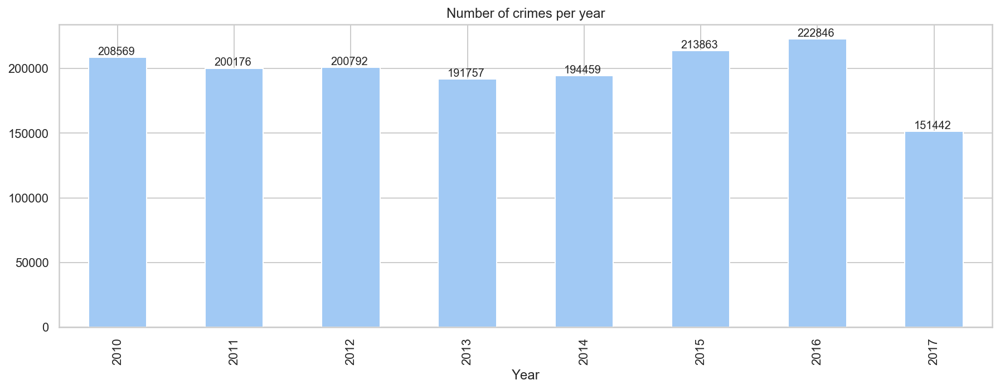

#Crimes in September 2017: 3311
#Crimes in October 2017: 0


In [15]:
data_year=data['Year'].groupby(data['Year']).count()
ax = pd.DataFrame(data_year).plot.bar(y=0,legend=False, figsize=(15,5),
                                              title='Number of crimes per year')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.08, p.get_height() + 2000))
plt.show()


data_2017 = data[data['Year']==2017]
print('#Crimes in September 2017:', len(data_2017[data['Month']==9]))
print('#Crimes in October 2017:', len(data_2017[data['Month']==10]))

We can see that the number of crimes has increased since 2013 and then dropped sharply in the last year. This is due to the fact that the data stops in October 2017, therefore 3 months of data are missing for this year.

**Crimes repartition by month**


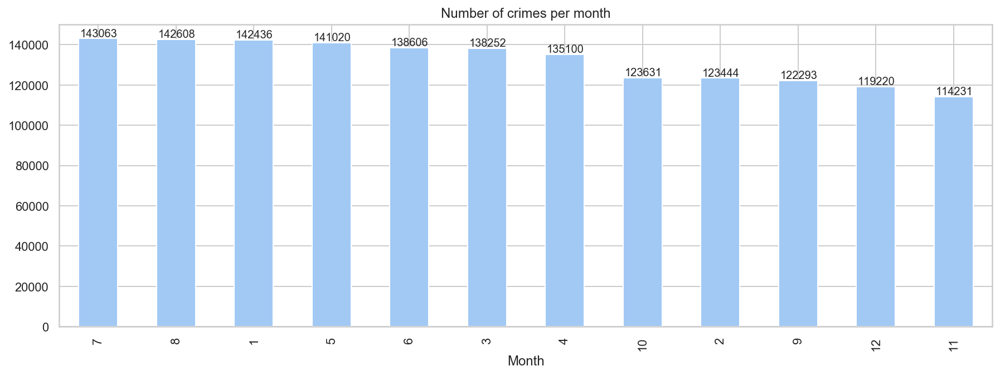

In [16]:
data_month=data['Month'].groupby(data['Month']).count().sort_values(0, ascending=False)
ax = pd.DataFrame(data_month).plot.bar(y=0,legend=False, figsize=(15,5),
                                              title='Number of crimes per month')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.02, p.get_height() + 1000))
plt.show()

The months in which the most offences are committed are the summer months, but the month of January is also very significant. The months least affected are the year-end months. But it there a global increase through month from 2010 to 2017 ?

**Increase of crime cases through months**

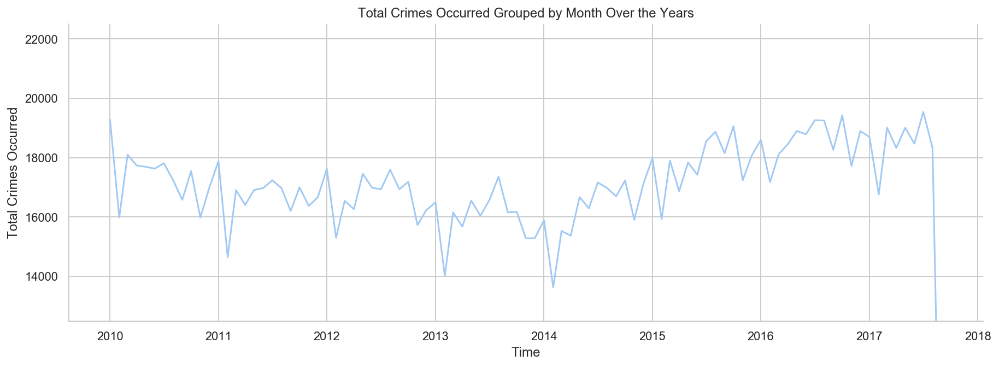

In [17]:
month_year_occ = [str(m)+"/"+str(y) for m,y in zip(data["Month"], data["Year"])]
month_year_occ_formatted = [datetime.datetime.strptime(d, "%m/%Y") for d in month_year_occ]
data["Month Year"] = np.array(month_year_occ_formatted)

fig, ax = plt.subplots(figsize=(15,5))
plt.plot(data["Month Year"].value_counts().sort_index().index, data["Month Year"].value_counts().sort_index())
ax.set_title("Total Crimes Occurred Grouped by Month Over the Years")
ax.set_ylim(12500, 22500)
ax.set_xlabel("Time")
ax.set_ylabel("Total Crimes Occurred")
sns.despine()

data = data.drop(columns=['Month Year'])

This graph largely reflects the trend in the distribution of crimes by year, an overall increase since February 2014, the month in which the least crimes were committed.

**Crimes Repartition by Days** 

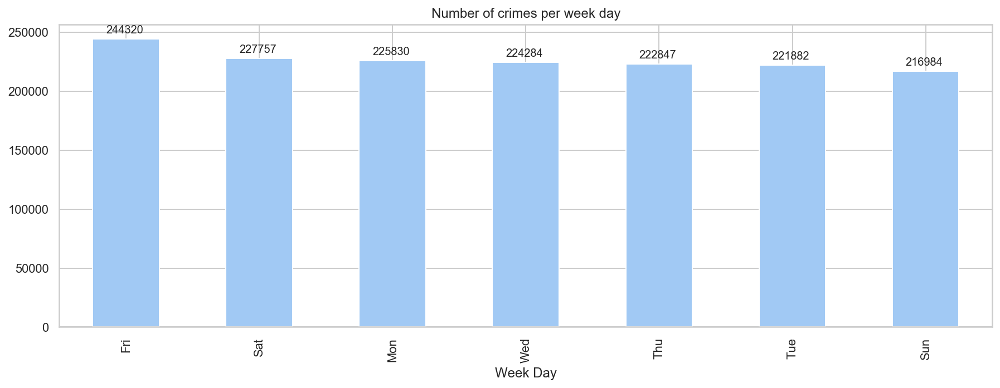

In [18]:
data_day=data['Week Day'].groupby(data['Week Day']).count().sort_values(0, ascending=False)
ax = pd.DataFrame(data_day).plot.bar(y=0,legend=False, figsize=(15,5), title='Number of crimes per week day')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.1, p.get_height() + 5000))
plt.show()

The number of crimes during the week seems fairly constant, but still higher on Fridays. This can be explained by the fact that people go to out more often on Friday nights, and many assaults take place in the evenings.

**Crimes Repartition by Hours**

In [19]:
def group_hours(time):
    if len(time)==1 or len(time)==2:
        return 0
    elif len(time)==3:
        return int(time[0])
    return int(time[:2])

def group_hours_shift(time):
    if time>=2 and time<=5:
        return '2-6['
    elif time>=6 and time<=9:
        return '6-10['
    elif time>=10 and time<=13:
        return '10-14['
    elif time>=14 and time<=17:
        return '14-18['
    elif time>=18 and time<=21:
        return '18-22['
    elif time>=22 or time<=1:
        return '22-2['

data["Time Occurred"] = data["Time Occurred"].apply(str)
data['Hour'] = data['Time Occurred'].apply(lambda time: group_hours(time))
data['Shift Hours'] = data['Hour'].apply(lambda time: group_hours_shift(time))
df = data.drop(columns=['Time Occurred', 'Date Occurred'])
df.sample(2)

,Reporting District,Crime Code Description,Victim Age,Victim Sex,Victim Descent,Premise Description,Weapon Description,Location,Year,Month,Day,Week Day,Hour,Shift Hours
580638,808,BURGLARY FROM VEHICLE,36.0,M,W,PARKING LOT,NaN,"(34.1132, -118.4249)",2012,6,10,Sun,18,18-22[
1413155,2013,BURGLARY FROM VEHICLE,53.0,M,H,STREET,NaN,"(34.0737, -118.3079)",2016,12,2,Fri,1,22-2[


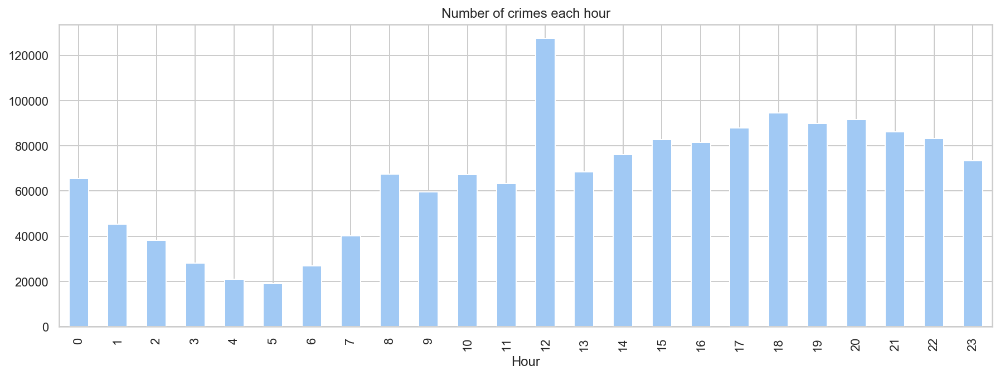

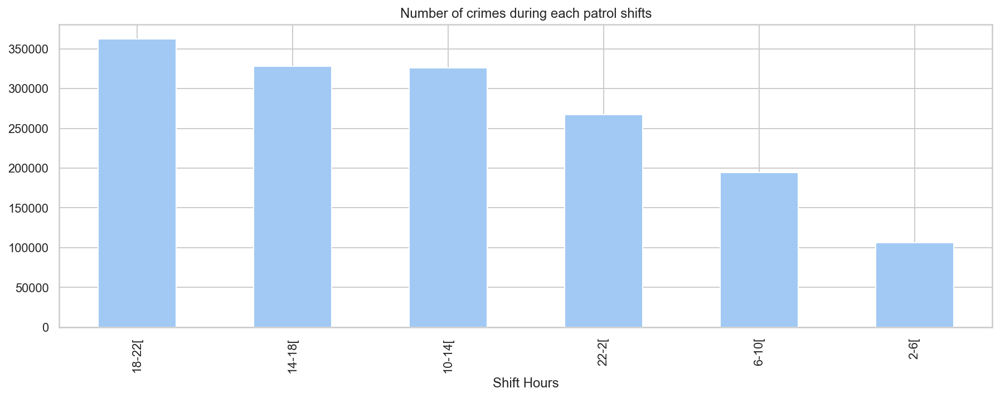

In [20]:
df_hour=df['Hour'].groupby(df['Hour']).count()
pd.DataFrame(df_hour).plot.bar(y=0,legend=False, figsize=(15,5), title='Number of crimes each hour')

df_hour=df['Shift Hours'].groupby(df['Shift Hours']).count().sort_values(0, ascending=False)
pd.DataFrame(df_hour).plot.bar(y=0,legend=False, figsize=(15,5), title='Number of crimes during each patrol shifts')
plt.show()

Notice that we've rounded off every hour to the previous half hour because the round hours came back much more often than the others... You can see that less crime happens at night than during the day. 

But what jumps out is the number of crimes committed at 12:00. This is thought to be due to crimes that cannot be precisely dated, such as crimes on the Internet, for example.

**Crimes Types at 12:00**

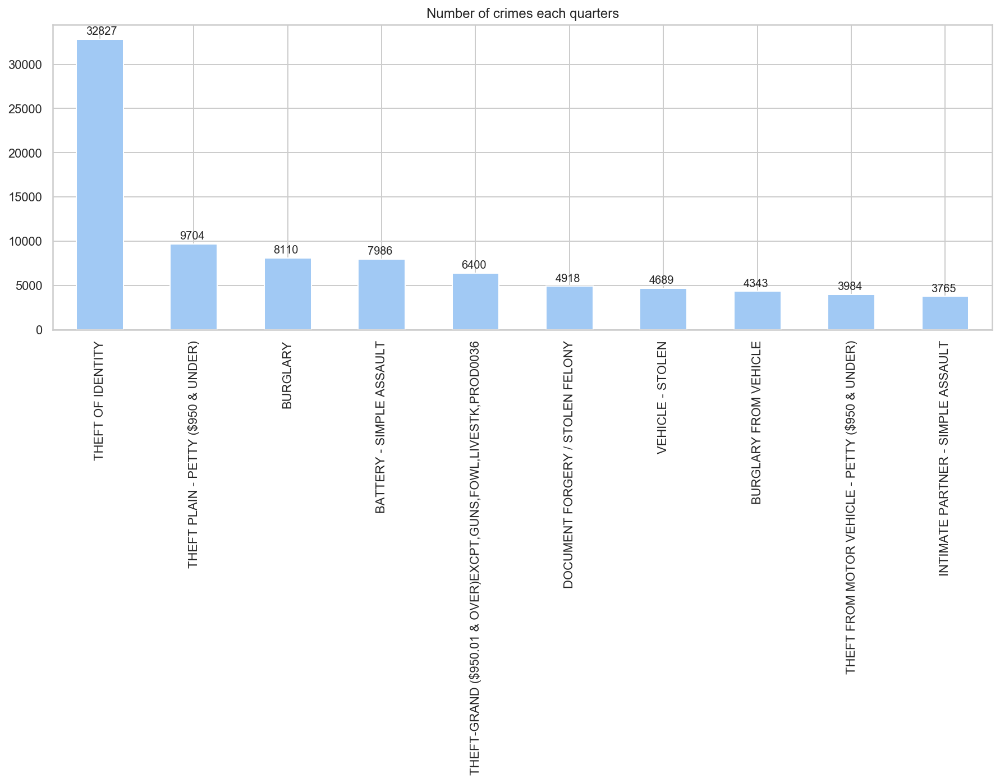

In [21]:
df_1200_crimeType = (df[df['Hour']==12])['Crime Code Description'].value_counts()
ax = pd.DataFrame(df_1200_crimeType[:10]).plot.bar(y=0,legend=False, figsize=(15,5), title='Number of crimes each quarters')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.1, p.get_height() + 500))
plt.show()

Theft of Identity is the most common crime type which happens during this time whereas at 11:30 and 12:30 theft of Identity  is not among the 10 most committed crimes. 

Theft of Identity is likely to happen online, which supports our hypothesis. However, this type of crime is difficult to operate for police patrols. Then we will delete theses type of crimes.

#### 2. Sex of the Victims 🔅

First we delete rows with nan values and group categories different from Male or Female together --> X values

In [22]:
data = df.copy()
def group_sex(s):
    if(s=='H' or s=='-'):
        return 'X'
    return s

data = data[data['Victim Sex'].notna()]
data['Victim Sex'] = data['Victim Sex'].apply(lambda s: group_sex(s))

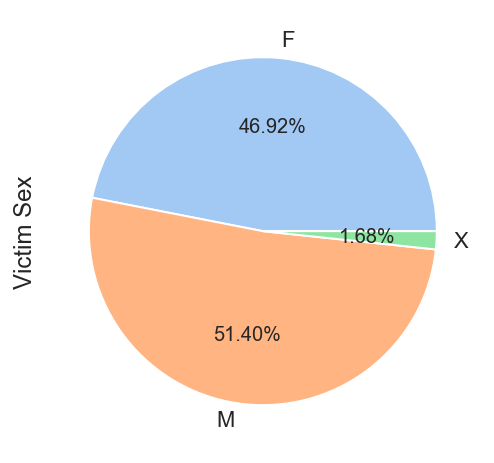

In [23]:
pd.DataFrame(data['Victim Sex']).groupby(data['Victim Sex']).count().plot.pie(y=0, autopct='%1.2f%%', startangle=0, legend=False)
plt.show()

It is evident that there are more Males involved than females.

#### 3. Age of the Victims 🔅

We first delete missing values.

In [24]:
df = data.copy()
df = df[df['Victim Age'].notna()]
pd.DataFrame(data["Victim Age"].describe()).T

,count,mean,std,min,25%,50%,75%,max
Victim Age,1330208.0,38.090351,15.965066,10.0,26.0,36.0,49.0,99.0


Mean of the victims are 36, and is supported by a median of 34. Let's visualize repartion of victim ages along with their sex.



#### 4. Age and Sex of the Victims


In [25]:
age_list = np.sort(df['Victim Age'].unique())
F_list = []
M_list = []
X_list = []
for year in list(df.groupby(df['Victim Age'])['Victim Sex'].sum()):
    F_list.append(year.count('F'))
    M_list.append(year.count('M'))
    X_list.append(year.count('X'))

In [26]:
t1={'x':age_list,'y':F_list,'name':'Female','type':'bar', 'marker':dict(color = 'rgb(168, 201, 240)')};
t2={'x':age_list,'y':M_list,'name':'Male','type':'bar', 'marker':dict(color = 'rgb(244, 182, 138)')};
t3={'x':age_list,'y':X_list,'name':'Others','type':'bar', 'marker':dict(color = 'rgb(161, 226, 167)')};
data1=[t1,t2,t3]
layout = {'xaxis': {'title': 'Age'},
          'barmode': 'relative',
          'title': 'Repartition of sex victims depending on the age'};
fig = go.Figure(data = data1, layout = layout)
pyo.iplot(fig)

Young people are noticeable and the elderly in general are not much affected. From the age of 20 onwards, the number of victims increases rapidly. We can also see that the most affected target are 25-year-old women with 20.4K crimes against them.

#### 5. Different types of crimes 🔅

Missing values have already been deleted above. But we need to reduce the number of categories since a lot of them are very similar. For instance, 'BUNCO, ATTEMPT', 'BUNCO, GRAND THEFT', 'BUNCO, PETTY THEFT' can be grouped under one category: 'BUNCO THEFT'. We don't want to differentiate between attempts and successful shots, because our goal is to know where every crime happens, even attempts. And we rename other categories to have simpler names.

In [27]:
data = df.copy()

In [28]:
print('Number of categories:', len(set(data['Crime Code Description'].to_list())))
set(data['Crime Code Description'].to_list())

Number of categories: 133


{'ABORTION/ILLEGAL',
 'ARSON',
 'ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER',
 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
 'ATTEMPTED ROBBERY',
 'BATTERY - SIMPLE ASSAULT',
 'BATTERY ON A FIREFIGHTER',
 'BATTERY POLICE (SIMPLE)',
 'BATTERY WITH SEXUAL CONTACT',
 'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM0065',
 'BIGAMY',
 'BIKE - ATTEMPTED STOLEN',
 'BIKE - STOLEN',
 'BLOCKING DOOR INDUCTION CENTER',
 'BOAT - STOLEN',
 'BOMB SCARE',
 'BRANDISH WEAPON',
 'BRIBERY',
 'BUNCO, ATTEMPT',
 'BUNCO, GRAND THEFT',
 'BUNCO, PETTY THEFT',
 'BURGLARY',
 'BURGLARY FROM VEHICLE',
 'BURGLARY FROM VEHICLE, ATTEMPTED',
 'BURGLARY, ATTEMPTED',
 'CHILD ABANDONMENT',
 'CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT',
 'CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT',
 'CHILD ANNOYING (17YRS & UNDER)',
 'CHILD NEGLECT (SEE 300 W.I.C.)',
 'CHILD STEALING',
 'CONSPIRACY',
 'CONTEMPT OF COURT',
 'CONTRIBUTING',
 'COUNTERFEIT',
 'CREDIT CARDS, FRAUD USE ($950 & UNDER',
 'CREDIT CARDS, FRAUD USE (

In [29]:
crimes_dict = {
    "ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER": "ASSAULT WITH DEADLY WEAPON",
    "ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT": "ASSAULT WITH DEADLY WEAPON",
    "ATTEMPTED ROBBERY": "ROBBERY",
    "BATTERY ON A FIREFIGHTER": "BATTERY ON OFFICER",
    "BATTERY POLICE (SIMPLE)": "BATTERY ON OFFICER",
    "BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM0065": "BEASTIALITY, CRIME AGAINST NATURE",
    "BIKE - ATTEMPTED STOLEN": "BIKE - STOLEN",
    "BUNCO, ATTEMPT": "BUNCO THIEF",
    "BUNCO, GRAND THEFT": "BUNCO THIEF",
    "BUNCO, PETTY THEFT": "BUNCO THIEF",
    "BURGLARY FROM VEHICLE": "BURGLARY",
    "BURGLARY FROM VEHICLE, ATTEMPTED": "BURGLARY",
    "BURGLARY, ATTEMPTED": "BURGLARY",
    "CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT": "CHILD ABUSE (PHYSICAL)",
    "CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT": "CHILD ABUSE (PHYSICAL)",
    "CREDIT CARDS, FRAUD USE ($950 & UNDER": "CREDIT CARDS, FRAUD USE",
    "CREDIT CARDS, FRAUD USE ($950.01 & OVER)": "CREDIT CARDS, FRAUD USE",
    "DEFRAUDING INNKEEPER/THEFT OF SERVICES, $400 & UNDER": "THEFT OF SERVICES",
    "DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $400": "THEFT OF SERVICES",
    "DISHONEST EMPLOYEE - GRAND THEFT": "DISHONEST EMPLOYEE THEFT",
    "DISHONEST EMPLOYEE - PETTY THEFT": "DISHONEST EMPLOYEE THEFT",
    "DISHONEST EMPLOYEE ATTEMPTED THEFT": "DISHONEST EMPLOYEE THEFT",
    "DOCUMENT WORTHLESS ($200 & UNDER)": "DOCUMENT WORTHLESS",
    "DOCUMENT WORTHLESS ($200.01 & OVER)": "DOCUMENT WORTHLESS",  
    "DRUNK ROLL - ATTEMPT": "DRUNK ROLL",
    "EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)": "EMBEZZLEMENT THEFT",
    "EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)": "EMBEZZLEMENT THEFT",
    "INCEST (SEXUAL ACTS BETWEEN BLOOD RELATIVES)": "INCEST",
    "INTIMATE PARTNER - AGGRAVATED ASSAULT": "INTIMATE PARTNER - ASSAULT",
    "INTIMATE PARTNER - SIMPLE ASSAULT": "INTIMATE PARTNER - ASSAULT",
    "KIDNAPPING - GRAND ATTEMPT": "KIDNAPPING",
    "LYNCHING - ATTEMPTED": "LYNCHING",
    "PICKPOCKET, ATTEMPT": "PICKPOCKET",
    "PURSE SNATCHING - ATTEMPT": "PURSE SNATCHING",
    "RAPE, ATTEMPTED": "RAPE",
    "RAPE, FORCIBLE": "RAPE",
    "SHOPLIFTING - ATTEMPT": "SHOPLIFTING",
    "SHOPLIFTING - PETTY THEFT ($950 & UNDER)": "SHOPLIFTING",
    "SHOPLIFTING-GRAND THEFT ($950.01 & OVER)": "SHOPLIFTING",
    "SHOTS FIRED AT INHABITED DWELLING": "SHOTS FIRED",
    "SHOTS FIRED AT MOVING VEHICLE, TRAIN OR AIRCRAFT": "SHOTS FIRED",
    "DISCHARGE FIREARMS/SHOTS FIRED": "SHOTS FIRED",
    "THEFT FROM MOTOR VEHICLE - ATTEMPT": "THEFT FROM MOTOR VEHICLE",
    "THEFT FROM MOTOR VEHICLE - GRAND ($400 AND OVER)": "THEFT FROM MOTOR VEHICLE",
    "THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)": "THEFT FROM MOTOR VEHICLE",
    "THEFT FROM PERSON - ATTEMPT": "THEFT, PERSON",
    "THEFT PLAIN - ATTEMPT": "THEFT PLAIN",
    "THEFT PLAIN - PETTY ($950 & UNDER)": "THEFT PLAIN",
    "THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD0036": "THEFT PLAIN",
    "THEFT, COIN MACHINE - ATTEMPT": "THEFT, COIN MACHINE",
    "THEFT, COIN MACHINE - GRAND ($950.01 & OVER)": "THEFT, COIN MACHINE",
    "THEFT, COIN MACHINE - PETTY ($950 & UNDER)": "THEFT, COIN MACHINE",
    "TILL TAP - GRAND THEFT ($950.01 & OVER)": "TILL TAP",
    "TILL TAP - PETTY ($950 & UNDER)": "TILL TAP",
    "VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS) 0114": "VANDALISM",
    "VANDALISM - MISDEAMEANOR ($399 OR UNDER)": "VANDALISM",
    "VEHICLE - ATTEMPT STOLEN": "VEHICLE - STOLEN",
    "VIOLATION OF TEMPORARY RESTRAINING ORDER": "VIOLATION OF COURT ORDER",
    "VIOLATION OF RESTRAINING ORDER": "VIOLATION OF COURT ORDER",
    "SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH 0007=02": "RAPE",
    "REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)0132": "REPLICA FIREARMS",
    "CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)0060": "CRIME AGAINST CHILD"
}

def group_crimes(crime):
    if(crime in crimes_dict):
        return crimes_dict[crime]
    return crime

data['Crime Code Description'] = data['Crime Code Description'].apply(lambda c: group_crimes(c))

for i in data['Crime Code Description'].unique():
    print('•', i, end=' ')
print('\nNumber of categories:', len(data['Crime Code Description'].unique()))


• INTIMATE PARTNER - ASSAULT • VANDALISM • CRIMINAL HOMICIDE • EMBEZZLEMENT THEFT • THEFT PLAIN • STALKING • SHOPLIFTING • BATTERY - SIMPLE ASSAULT • DOCUMENT FORGERY / STOLEN FELONY • BIKE - STOLEN • ROBBERY • RAPE • TRESPASSING • COUNTERFEIT • ASSAULT WITH DEADLY WEAPON • THROWING OBJECT AT MOVING VEHICLE • THEFT OF SERVICES • CRIMINAL THREATS - NO WEAPON DISPLAYED • BURGLARY • BATTERY WITH SEXUAL CONTACT • OTHER MISCELLANEOUS CRIME • CHILD ABUSE (PHYSICAL) • INDECENT EXPOSURE • OTHER ASSAULT • THEFT, PERSON • BOMB SCARE • EXTORTION • THEFT FROM MOTOR VEHICLE • DISTURBING THE PEACE • CHILD ANNOYING (17YRS & UNDER) • SHOTS FIRED • BATTERY ON OFFICER • BRANDISH WEAPON • SEXUAL PENTRATION WITH A FOREIGN OBJECT • THEFT OF IDENTITY • VIOLATION OF COURT ORDER • LETTERS, LEWD • CRIME AGAINST CHILD • FALSE IMPRISONMENT • BUNCO THIEF • PURSE SNATCHING • ARSON • VEHICLE - STOLEN • CRUELTY TO ANIMALS • KIDNAPPING • LEWD CONDUCT • PROWLER • PIMPING • RESISTING ARREST • PEEPING TOM • SEX, UNLAWFU

Even it these categories, it remains crimes that are not very interesting to us, such as crimes that occurs online or crimes where the police cannot operate directly. We delete them:

In [30]:
to_del = ['DOCUMENT FORGERY / STOLEN FELONY', 'THEFT OF IDENTITY', 'THREATENING PHONE CALLS/LETTERS', 'UNAUTHORIZED COMPUTER ACCESS', 'CREDIT CARDS, FRAUD USE', 'CONTEMPT OF COURT']
data = data[data['Crime Code Description'].isin(to_del)==False]
print('\nNumber of categories:', len(data['Crime Code Description'].unique()))


Number of categories: 87


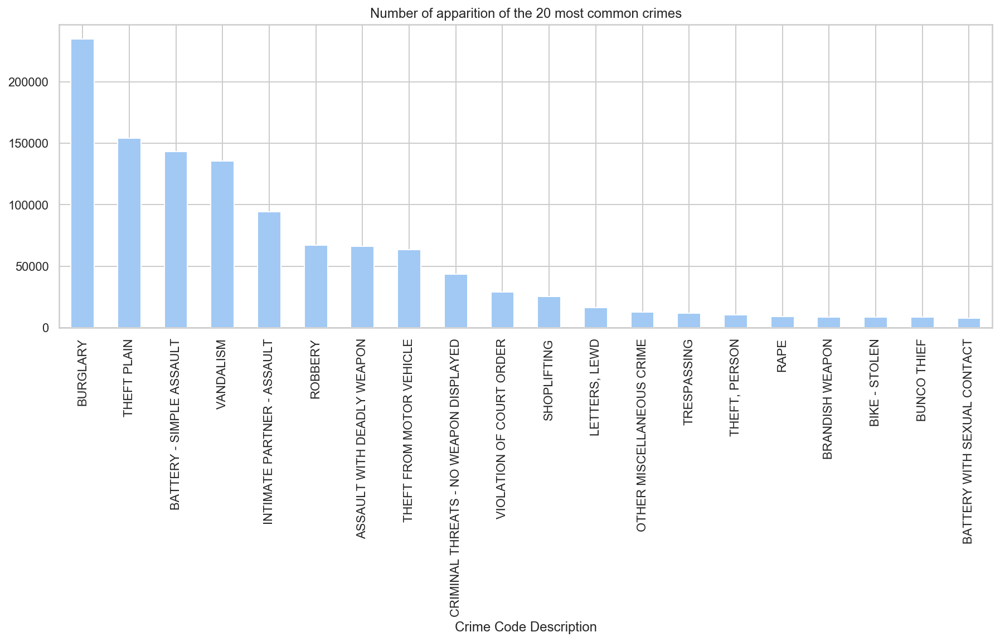

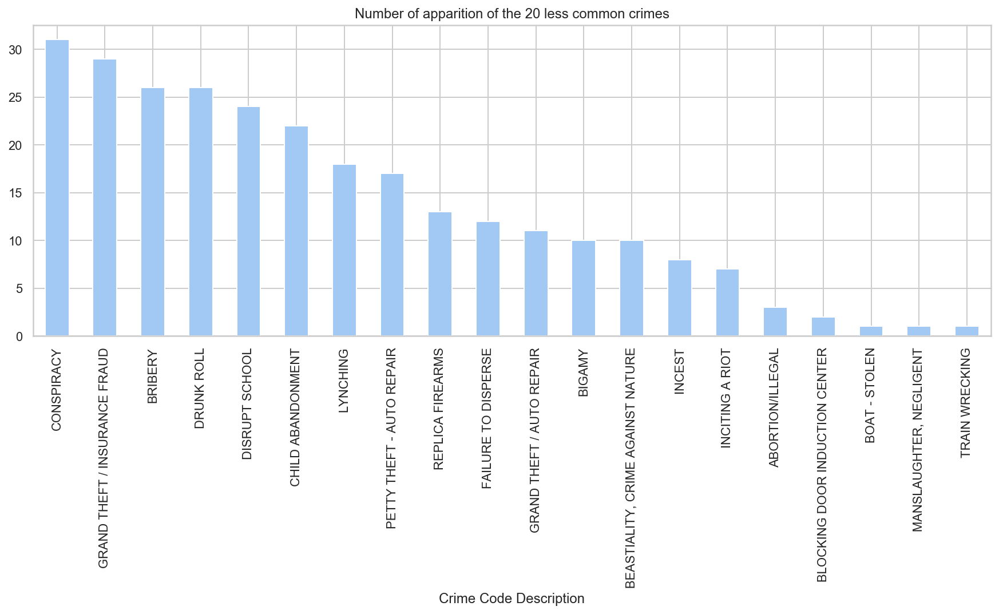

In [31]:
crime_categories=data['Crime Code Description'].groupby(data['Crime Code Description']).count().sort_values(0, ascending=False)
pd.DataFrame(crime_categories[:20]).plot.bar(y=0,legend=False, figsize=(15,5), title='Number of apparition of the 20 most common crimes')
pd.DataFrame(crime_categories[-20:]).plot.bar(y=0,legend=False, figsize=(15,5), title='Number of apparition of the 20 less common crimes')
plt.show()

After reducing categories by grouping several of them together, we can see a wide spread between the most and least common crimes. The most common ones are buglaries, thefts and simple quarrels (somethings we often see), while the least common one, which happened only once, is the destruction of a train.

#### 6. Sex and Types of Crime

In [32]:
df = data.copy()
gbs_crime = df.groupby('Victim Sex')['Crime Code Description'].value_counts()
top5_crime_F = gbs_crime.loc['F'][:5]#.to_list()
top5_crime_M = gbs_crime.loc['M'][:5]#.to_list()
top5_crime_X = gbs_crime.loc['X'][:5]#.to_list()

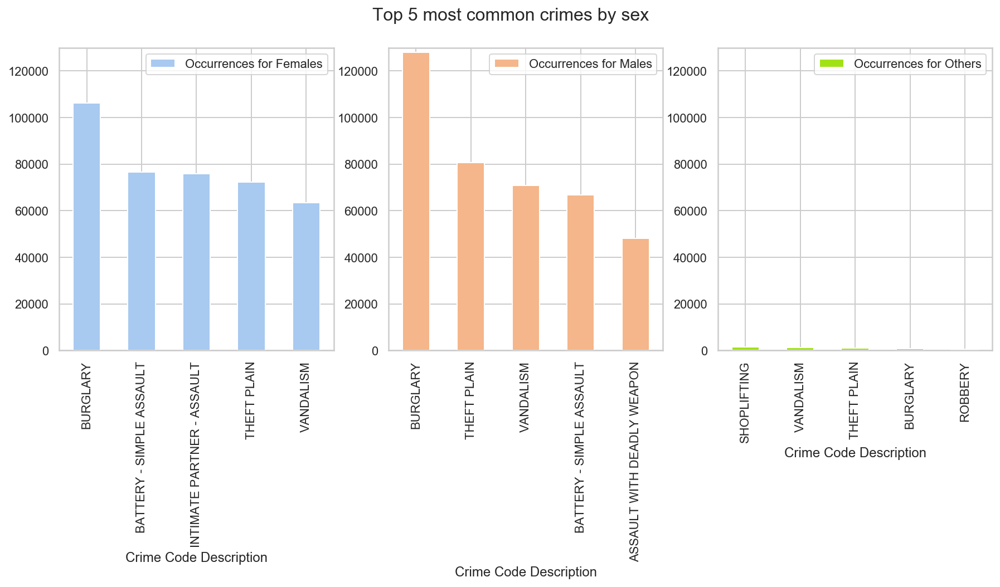

In [33]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
biz1 = pd.DataFrame(top5_crime_F)
biz1.columns = ['Occurrences for Females']
biz1.plot(kind='bar', ax=axes[0], ylim=(0,130000), color='#A8C9F0')

biz2 = pd.DataFrame(top5_crime_M)
biz2.columns = ['Occurrences for Males']
biz2.plot(kind='bar', ax=axes[1], ylim=(0,130000), color='#F4B68A')

biz3 = pd.DataFrame(top5_crime_X)
biz3.columns = ['Occurrences for Others']
biz3.plot(kind='bar', ax=axes[2], ylim=(0,130000), color='#A1E217')

fig.suptitle('Top 5 most common crimes by sex', fontsize=16)

plt.show()

Burglary is the most common crime committed against women and men. However, women are more victims of Simple Assault than men, and especially often victims of Intimate Partner Assault. Men, on the other hand, are more victims of theft. For the category concerning the other sex, the majority of crimes committed against them are shoplifting, perhaps due to the high representation of young teens in this category.

#### 7. Crime Types by age group



In [34]:
data = df.copy()
data['Victim Tranche Age'] = data['Victim Age'].apply(lambda age: age - age%20)
gbta_crime = data.groupby('Victim Tranche Age')['Crime Code Description'].value_counts()
top5_crime_00 = gbta_crime.loc[0][:5]#.to_list()
top5_crime_20 = gbta_crime.loc[20][:5]#.to_list()
top5_crime_40 = gbta_crime.loc[40][:5]#.to_list()
top5_crime_60 = gbta_crime.loc[60][:5]#.to_list()
top5_crime_80 = gbta_crime.loc[80][:5]#.to_list()

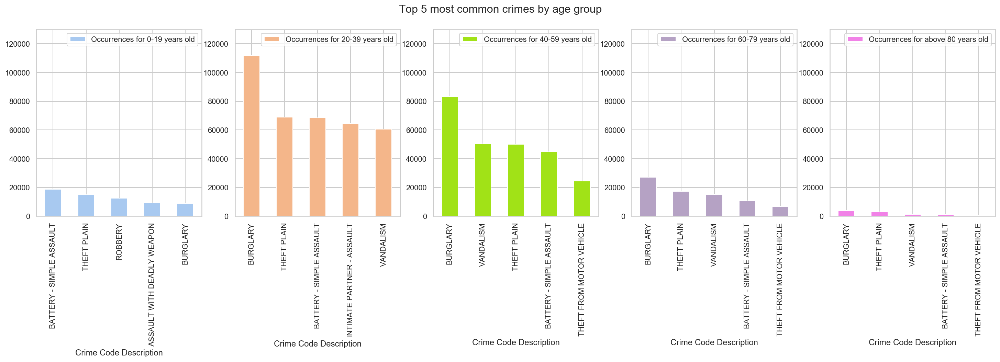

In [35]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(25,5))
biz1 = pd.DataFrame(top5_crime_00)
biz1.columns = ['Occurrences for 0-19 years old']
biz1.plot(kind='bar', ax=axes[0], ylim=(0,130000), color='#A8C9F0')

biz2 = pd.DataFrame(top5_crime_20)
biz2.columns = ['Occurrences for 20-39 years old']
biz2.plot(kind='bar', ax=axes[1], ylim=(0,130000), color='#F4B68A')

biz3 = pd.DataFrame(top5_crime_40)
biz3.columns = ['Occurrences for 40-59 years old']
biz3.plot(kind='bar', ax=axes[2], ylim=(0,130000), color='#A1E217')

biz4 = pd.DataFrame(top5_crime_60)
biz4.columns = ['Occurrences for 60-79 years old']
biz4.plot(kind='bar', ax=axes[3], ylim=(0,130000), color='#B5A2C4')

biz5 = pd.DataFrame(top5_crime_80)
biz5.columns = ['Occurrences for above 80 years old']
biz5.plot(kind='bar', ax=axes[4], ylim=(0,130000), color='#F182E7')


fig.suptitle('Top 5 most common crimes by age group', fontsize=16)

plt.show()

We can see that burglaries concern all age groups except the youngest, as they have no houses. But quite surprisingly, Assault with a deadly weapon is very common for them while not in others categories.

#### 8. Crimes at different Premises 🔅

As usual we drop nan values first. Since they represent a very small fraction of the data.

In [36]:
print('Proportion of nan values:', len(data[data['Premise Description'].isna()])/len(data['Premise Description'])*100, '%')

Proportion of nan values: 0.18909864908256122 %


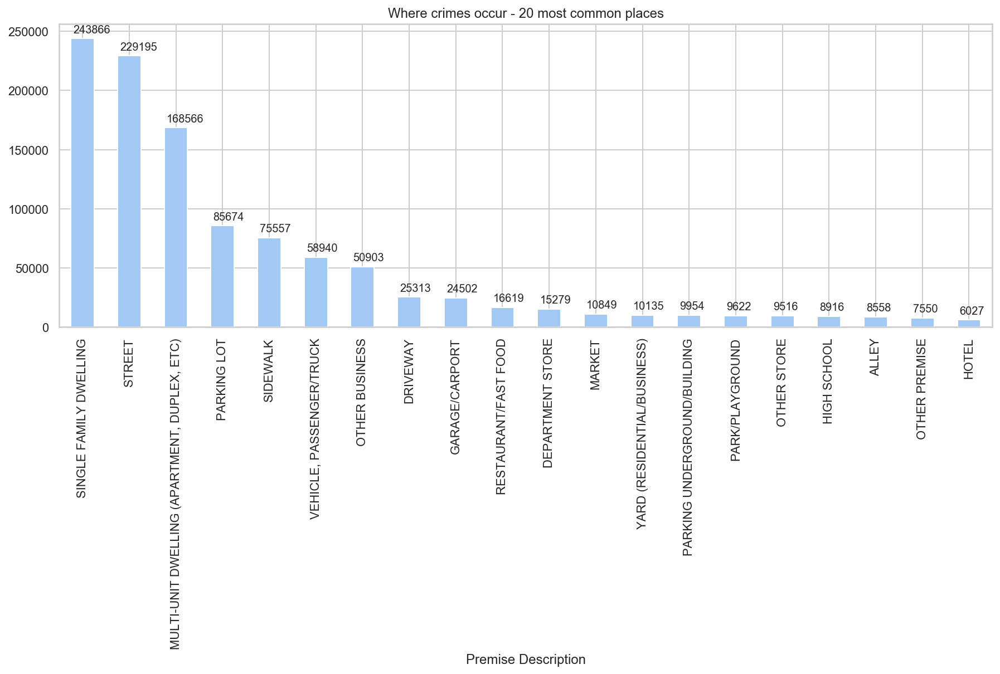

In [37]:
df = data[data['Premise Description'].notna()]
premise_categories=df['Premise Description'].groupby(df['Premise Description']).count().sort_values(0, ascending=False)
ax = pd.DataFrame(premise_categories[:20]).plot.bar(y=0,legend=False, figsize=(15,5), title='Where crimes occur - 20 most common places')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.05, p.get_height() + 5000))
plt.show()


Street , Single family dwelling , Multi unit bwelling, Parking lot rank among the top places for Crimes.


#### 9. Victim Descent Analysis 🔅

As usual we delete missing values if their is few of them. Moreover, victim descent means  the origin of the victims. We need to change the abbreviation by something more understandable.  Here is a mapping that we found on the web: 


In [38]:
group_descent = {
    "A": "Other Asian",
    "B": "Black",
    "C": "Chinese",
    "D": "Cambodian",
    "F": "Filipino",
    "G": "Guamanian",
    "H": "Hispanic/Latin/Mexican",
    "I": "American Indian/Alaskan Native",
    "J": "Japanese",
    "K": "Korean",
    "L": "Laotian",
    "O": "Other",
    "P": "Pacific Islander",
    "S": "Samoan",
    "U": "Hawaiian",
    "V": "Vietnamese",
    "W": "White",
    "X": "Unknown",
    "Z": "Asian Indian"
}
data = df.copy()
data["Victim Descent"] = data["Victim Descent"].map(group_descent)

In [39]:
print('Proportion of nan values:', len(data[data['Victim Descent'].isna()])/len(data['Victim Descent'])*100, '%')

Proportion of nan values: 0.0022386593249695916 %


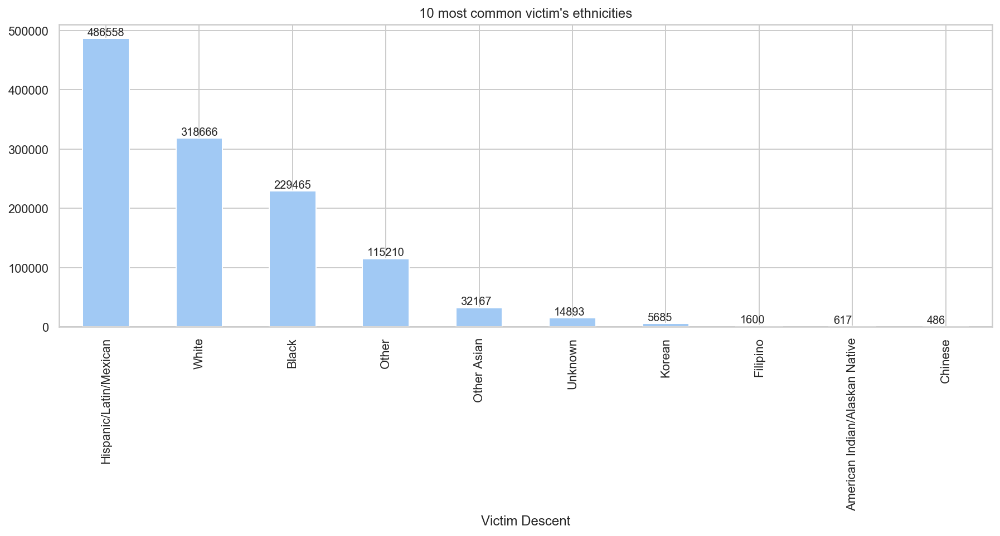

In [40]:
data = data[data['Victim Descent'].notna()]
etni_categories=data['Victim Descent'].groupby(data['Victim Descent']).count().sort_values(0, ascending=False)
ax = pd.DataFrame(etni_categories[:10]).plot.bar(y=0,legend=False, figsize=(15,5), title="10 most common victim's ethnicities")
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.05, p.get_height() + 5000))
plt.show()

We observe Hispanic, White and Black are the top categories where the Victims are present.
This makes sense given that the population of Los Angeles is largely made up of these categories of people. What is interesting here is that there are few different ethnicities who are victims of these crimes.

#### 10. Weapon Analysis 🔅

Here not all crimes are commited with a weapon. Besides, most of them are unarmed, fortunately! We need to process this column, before to plat any repartition.

In [41]:
df = data.copy()

def group_weapon(x):
    crime = x[0]
    weapon = x[1]
    if(crime == 'ASSAULT WITH DEADLY WEAPON' and type(weapon) == float) :
        return 'UNKNOWN DEADLY WEAPON'
    elif(type(weapon) == float):
        return '-'
    return weapon

df['Weapon Description'] = df[['Crime Code Description', 'Weapon Description']].apply(lambda x: group_weapon(x), axis=1)

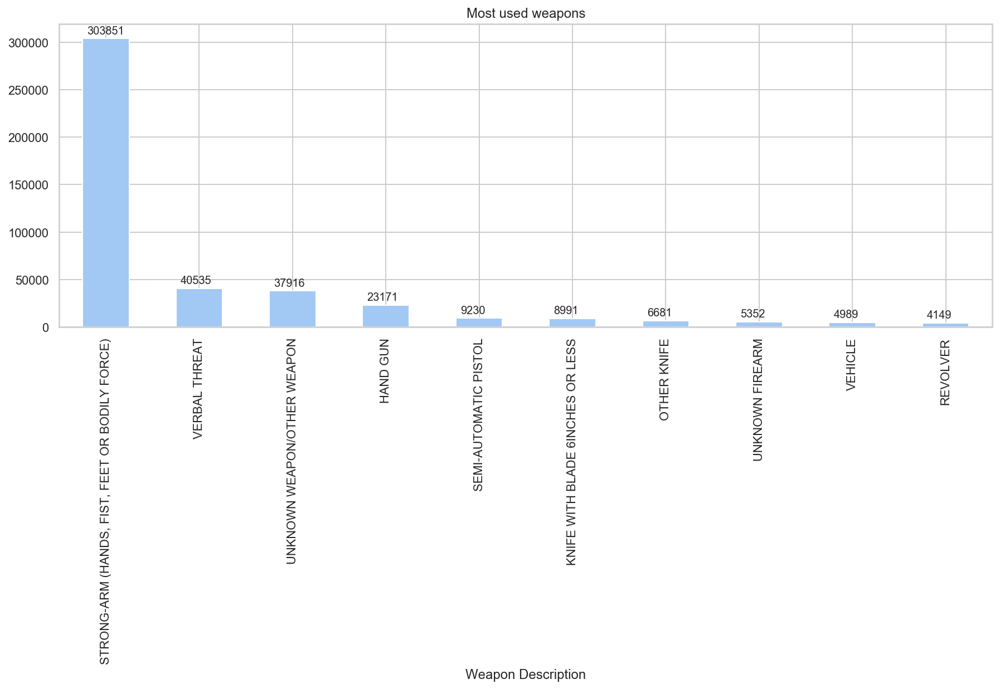

In [42]:
weapon_categories=df['Weapon Description'].groupby(df['Weapon Description']).count().sort_values(0, ascending=False)
ax = pd.DataFrame(weapon_categories[1:11]).plot.bar(y=0,legend=False, figsize=(15,5), title='Most used weapons')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0.05, p.get_height() + 5000))
plt.show()
data = df.copy()

In [43]:
data.columns

Index(['Reporting District', 'Crime Code Description', 'Victim Age',
       'Victim Sex', 'Victim Descent', 'Premise Description',
       'Weapon Description', 'Location ', 'Year', 'Month', 'Day', 'Week Day',
       'Hour', 'Shift Hours', 'Victim Tranche Age'],
      dtype='object')

In [44]:
data = data.rename(columns={'Location ': 'Location'})
data = data[data['Location'].notna()]

#### 11. Map

We know process other files, in particular the shp one, which contains polygons to draw a map.

Here is a Google Earth vizualization of districts LAPD cover and we can process:

<img src="images/LAPD_districts.png">



**Plot a specific district**

In [45]:
shp_path = DATA_ROOT+"LAPD_Reporting_Districts.shp"
sf = shp.Reader(shp_path)

def shp_to_df(sf):
    fields = [x[0] for x in sf.fields][1:]
    records = sf.records()
    shps = [s.points for s in sf.shapes()]
    df = pd.DataFrame(columns=fields, data=records)
    df = df.assign(coords=shps)
    df.drop(columns=['TOOLTIP'], inplace=True)
    return df

def plot_district(sf, id, s=None, bureau=None):
    plt.figure(figsize=(10,7))
    ax = plt.axes()
    ax.set_aspect('equal')
    shape_ex = sf.shape(id)
    x_lon = np.zeros((len(shape_ex.points),1))
    y_lat = np.zeros((len(shape_ex.points),1))
    for ip in range(len(shape_ex.points)):
        x_lon[ip] = shape_ex.points[ip][0]
        y_lat[ip] = shape_ex.points[ip][1]
    plt.plot(x_lon,y_lat) 
    x0 = np.mean(x_lon)
    y0 = np.mean(y_lat)

    if bureau!= None:
        str1 = 'Bureau: '+bureau
        plt.text(x0, (y0-0.005), str1, fontsize=10)
    if s!= None:
        str2 = 'District: '+str(s)
        plt.text(x0, y0, str2, fontsize=10)
    plt.xlim(shape_ex.bbox[0],shape_ex.bbox[2])
    print('Coordinates of the centre of the district: ', x0,',',y0)

df_shp = shp_to_df(sf)
display(df_shp.sample(5))
df_shp.info()

,OBJECTID,REPDIST,PREC,APREC,BUREAU,BASICCAR,coords
268,269,2157,21,TOPANGA,VALLEY BUREAU,21A57,"[(-118.59282845905553, 34.195248616927906), (-..."
512,513,417,4,HOLLENBECK,CENTRAL BUREAU,4A15,"[(-118.1956032543133, 34.08505419071843), (-11..."
78,79,1745,17,DEVONSHIRE,VALLEY BUREAU,17A49,"[(-118.52158067650105, 34.26490847994436), (-1..."
569,570,2016,20,OLYMPIC,WEST BUREAU,20A25,"[(-118.30039171141087, 34.07277934153971), (-1..."
587,588,2021,20,OLYMPIC,WEST BUREAU,20A1,"[(-118.32291554551982, 34.06896041408392), (-1..."


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1135 entries, 0 to 1134
Data columns (total 7 columns):
OBJECTID    1135 non-null int64
REPDIST     1135 non-null int64
PREC        1135 non-null int64
APREC       1135 non-null object
BUREAU      1135 non-null object
BASICCAR    1135 non-null object
coords      1135 non-null object
dtypes: int64(3), object(4)
memory usage: 62.2+ KB


Here each district is differs from another throught it's district number which can be taken in the column REPDIST. Let's visualize the shape of District 1494:

Coordinates of the centre of the district:  -118.41820651212711 , 33.94649617501613


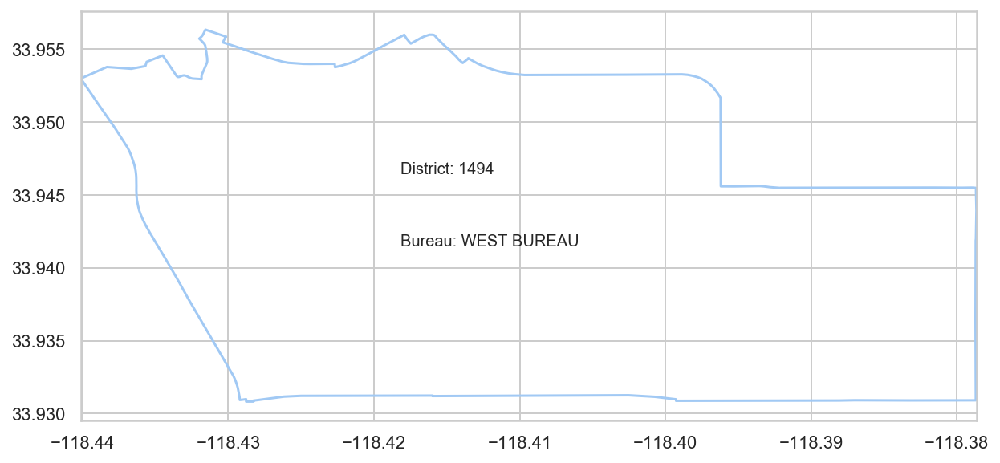

In [46]:
district = 1494
com_id = df_shp[df_shp.REPDIST == district].index[0]
bureau = df_shp[df_shp.REPDIST == district]['BUREAU'].values.item()
plot_district(sf, com_id, district, bureau)

You can recognize the airport district by the purple above. Now let's try to represent the whole map. 

**Plot all districts in an interactive map**


In [47]:
shapefile = DATA_ROOT+'LAPD_Reporting_Districts.shp'
#Read shapefile using Geopandas
data_viz = gpd.read_file(shapefile)
data_viz.drop(columns=['TOOLTIP'], inplace=True)
data_viz.set_index(['OBJECTID'],inplace=True)
data_viz.head()

,REPDIST,PREC,APREC,BUREAU,BASICCAR,geometry
OBJECTID,,,,,,
1,1901,19,MISSION,VALLEY BUREAU,19A1,"POLYGON ((-118.50736 34.33464, -118.50381 34.3..."
2,1705,17,DEVONSHIRE,VALLEY BUREAU,17A35,"POLYGON ((-118.50736 34.33464, -118.50668 34.3..."
3,1902,19,MISSION,VALLEY BUREAU,19A7,"POLYGON ((-118.45182 34.32405, -118.44965 34.3..."
4,1903,19,MISSION,VALLEY BUREAU,19A7,"POLYGON ((-118.45182 34.32405, -118.45201 34.3..."
5,1904,19,MISSION,VALLEY BUREAU,19A7,"POLYGON ((-118.45182 34.32405, -118.45169 34.3..."


In [48]:
data_viz.describe().T

,count,mean,std,min,25%,50%,75%,max
REPDIST,1135.0,1162.681057,603.566927,101.0,643.5,1169.0,1678.5,2199.0
PREC,1135.0,11.164758,6.019823,1.0,6.0,11.0,16.0,21.0


In [49]:
#Read data to json.
merged_json = json.loads(data_viz.to_json())
#Convert to String like object.
json_data = json.dumps(merged_json)

#Input GeoJSON source that contains features for plotting.
geosource = GeoJSONDataSource(geojson = json_data)
#Define a sequential multi-hue color palette.
palette = brewer['YlGnBu'][8]
#Reverse color order so that dark blue is highest obesity.
palette = palette[::-1]
#Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
color_mapper = LinearColorMapper(palette = palette, low = 100, high = 2200)
#Create color bar. 
ticks = [int(i) for i in np.linspace(100, 2200, 9)]
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,
                     width = 500, height = 20, border_line_color=None,
                     location = (0,0), orientation = 'horizontal', 
                    ticker = FixedTicker(ticks=ticks))

#Create figure object.
p = figure(title = 'Map of every districts controlled by LAPD ranked by their district number', plot_height = 600 , plot_width = 500)

#Add patch renderer to figure. 
p.patches('xs','ys', source = geosource, fill_color = {'field' :'REPDIST', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)

#Add interactivity to the map
my_hover = HoverTool()
my_hover.tooltips = [('District nb', '@REPDIST'),
                     ('Bureau','@BUREAU')]
p.add_tools(my_hover)

#Specify figure layout.
p.add_layout(color_bar, 'below')
#Display figure.
show(p)

Obviously some districts are missing from our visualization, but it will already allow us to display the data a little more clearly. For visualization, it doesn't matter if there is data on non-visualizable districts (**case1**). On the other hand, if we don't have data for one of the districts that we can visualize, then we have to remove that district from our map (**case2**)

In [50]:
a = data['Reporting District'].unique()
b = data_viz['REPDIST'].unique()
print('case1: ',  np.setdiff1d(a,b))
print('\ncase2: ',  np.setdiff1d(b,a))

case1:  [ 100  200  213  214  222  223  226  228  232  234  242  243  244  253
  254  264  267  276  282  284  286  296  300  400  500  600  609  663
  696  697  703  704  707  709  718  728  731  746  748  756  757  761
  772  786  792  800  900  922  924  925  928  934  936  945  951  953
  958  962  965  967  968  972  973  975  977  978  983  986  988 1000
 1002 1013 1016 1026 1032 1036 1038 1042 1046 1048 1052 1053 1055 1057
 1059 1066 1069 1072 1076 1085 1093 1100 1200 1400 1500 1518 1534 1536
 1537 1542 1552 1568 1592 1600 1626 1627 1646 1648 1674 1692 1694 1697
 1700 1702 1706 1724 1726 1731 1732 1733 1736 1744 1746 1786 1800 1923
 1927 1933 1942 1953 1973 1986 1996 1997 2100]

case2:  [2199]


In [51]:
data_viz = data_viz[data_viz['REPDIST']!=2199]

#### 12. Worst-affected districts 🔅

We can now combine both datasets in order to render valuable data. But first, let's see first how crimes are distributed among districts.

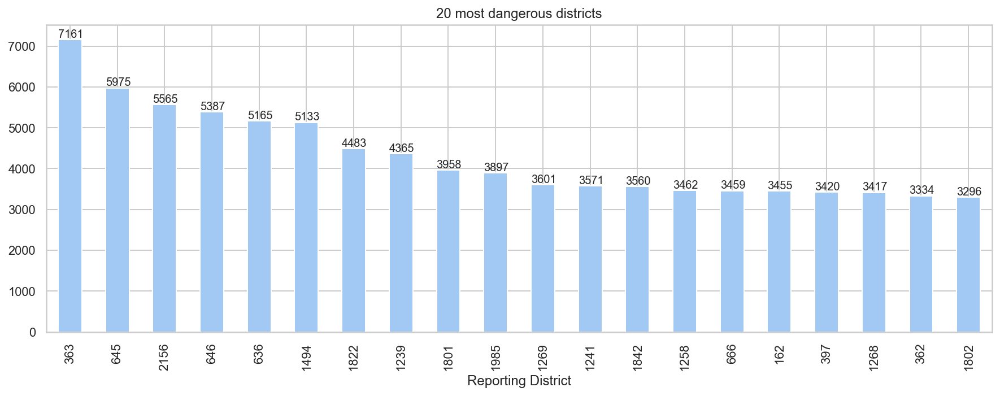

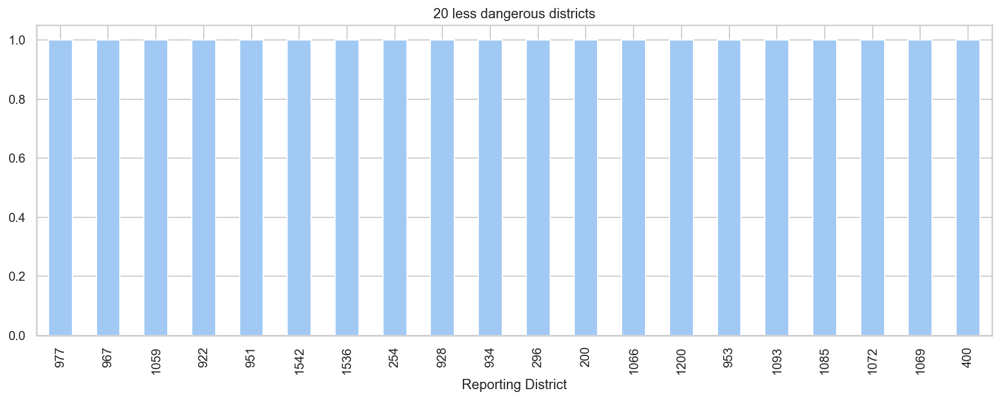

In [52]:
district_count=data['Reporting District'].groupby(data['Reporting District']).count().sort_values(0, ascending=False)
ax = pd.DataFrame(district_count[0:20]).plot.bar(y=0,legend=False, figsize=(15,5), title='20 most dangerous districts')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() +0, p.get_height() + 50))
ax = pd.DataFrame(district_count[-20:]).plot.bar(y=0,legend=False, figsize=(15,5), title='20 less dangerous districts')
plt.show()

Fortunately among these districts, which will be of particular interest to us in the course of the project, no one is missing in our visualization.

In [53]:
def plot_LA(data_filtered, data_viz, title):
    
    #Data process
    district_count=data_filtered['Reporting District'].groupby(data_filtered['Reporting District']).count().sort_values(0, ascending=False)
    a = data_filtered['Reporting District'].unique()
    b = data_viz['REPDIST'].unique()
    data_viz_filtered = data_viz[data_viz['REPDIST'].isin(np.setdiff1d(b,a))==False]
    data_viz_filtered['crime_nb'] = data_viz_filtered['REPDIST'].apply(lambda dist: district_count[dist])
    vizu_param = data_viz_filtered['crime_nb']
    low = np.min(vizu_param.unique())
    high = np.max(vizu_param.unique())
    
    #Read data to json.
    merged_json = json.loads(data_viz_filtered.to_json())
    #Convert to String like object.
    json_data = json.dumps(merged_json)

    #Input GeoJSON source that contains features for plotting.
    geosource = GeoJSONDataSource(geojson = json_data)
    #Define a sequential multi-hue color palette.
    palette = brewer['YlOrRd'][7]
    #Reverse color order so that dark blue is highest obesity.
    palette = palette[::-1]
    #Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette = palette, low = low, high = high)
    #Create color bar. 
    ticks = [int(i) for i in np.linspace(low, high, 8)]
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,
                         width = 470, height = 20, border_line_color=None,
                         location = (0,0), orientation = 'horizontal',
                         ticker = FixedTicker(ticks=ticks))

    #Create figure object.
    p = figure(title = title, plot_height = 600 , plot_width = 500)

    #Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource, fill_color = {'field' :'crime_nb', 'transform' : color_mapper},
              line_color = 'black', line_width = 0.25, fill_alpha = 1)

    #Add interactivity to the map
    my_hover = HoverTool()
    my_hover.tooltips = [('District nb', '@REPDIST'),
                         ('Bureau','@BUREAU'), 
                         ('Nb Crimes','@crime_nb')]
    p.add_tools(my_hover)

    #Specify figure layout.
    p.add_layout(color_bar, 'below')
    #Display figure.
    show(p)

In [54]:
plot_LA(data, data_viz, 'Map of every districts controlled by LAPD ranked by number of crimes')

District 363 is the most affected, let's see where crimes occur in this district particularly.

#### 13. Where crime happened in the Worst-affected district

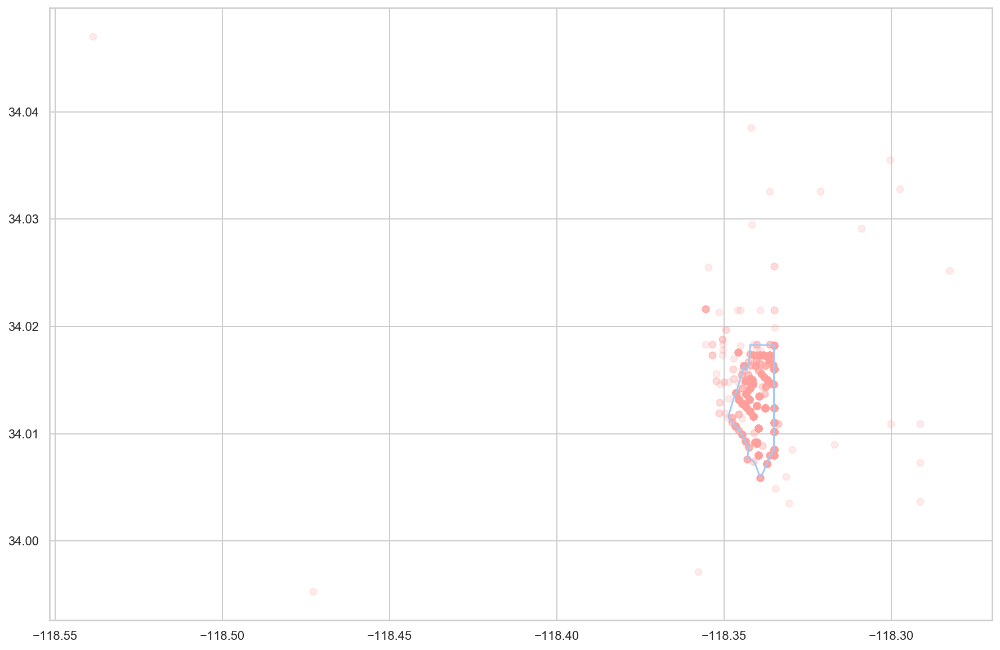

In [55]:
def plot_district_with_crimes(district_nb, data):
    data_d = data[data['Reporting District']==district_nb]
    data_d['Latitude'] = data_d['Location'].apply(lambda x: float(x.split()[0][1: len(x.split()[0])-1]))
    data_d['Longitude'] = data_d['Location'].apply(lambda x: float(x.split()[1][0: len(x.split()[1])-1]))
    data_d = data_d[data_d['Latitude']!=0]
    data_d = data_d[data_d['Longitude']!=0]
    lat = data_d['Latitude'].to_list()
    long = data_d['Longitude'].to_list()

    com_id = df_shp[df_shp.REPDIST == district_nb].index[0]
    bureau = df_shp[df_shp.REPDIST == district_nb]['BUREAU'].values.item()
    
    plt.figure(figsize=(15, 10))
    shape_ex = sf.shape(com_id)
    x_lon = []
    y_lat = []
    for ip in range(len(shape_ex.points)):
        x_lon.append(shape_ex.points[ip][0])
        y_lat.append(shape_ex.points[ip][1])

    plt.plot(x_lon,y_lat) 
    plt.scatter(np.array(long), np.array(lat), c='r', alpha=0.2)

    plt.show()
    
plot_district_with_crimes(363, data)

It can be seen that the data is not very accurate and sometimes goes outside the given district. It would be more convincing if we plotted the crimes over the entire city.

In [ ]:
def plot_map(sf, data):
    
    data_d = data.copy()
    data_d['Latitude'] = data_d['Location'].apply(lambda x: float(x.split()[0][1: len(x.split()[0])-1]))
    data_d['Longitude'] = data_d['Location'].apply(lambda x: float(x.split()[1][0: len(x.split()[1])-1]))
    data_d = data_d[data_d['Latitude']!=0]
    data_d = data_d[data_d['Longitude']!=0]
    lat = data_d['Latitude'].to_list()
    long = data_d['Longitude'].to_list()
    
    plt.figure(figsize = (11,15))

    for shape in sf.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]
        y = [i[1] for i in shape.shape.points[:]]
        plt.plot(x, y, 'k')
    plt.scatter(np.array(long), np.array(lat), c='r', alpha=0.2)


plot_map(sf, data)


Even here Location data is not much precise, we will then refer to district number only.

#### Worst-affected district given week day

In [ ]:
plot_LA(data[data['Week Day']=='Mon'], data_viz, 'Districts ranked by number of crimes on Monday')
plot_LA(data[data['Week Day']=='Tue'], data_viz, 'Districts ranked by number of crimes on Tuesday')
plot_LA(data[data['Week Day']=='Wed'], data_viz, 'Districts ranked by number of crimes on Wednesday')
plot_LA(data[data['Week Day']=='Thu'], data_viz, 'Districts ranked by number of crimes on Thursday')
plot_LA(data[data['Week Day']=='Fri'], data_viz, 'Districts ranked by number of crimes on Friday')
plot_LA(data[data['Week Day']=='Sat'], data_viz, 'Districts ranked by number of crimes on Saturday')
plot_LA(data[data['Week Day']=='Sun'], data_viz, 'Districts ranked by number of crimes on Sunday')

The evolution of crime between neighbourhoods over the week appears stable

#### Worst-affected district given year

In [ ]:
plot_LA(data[data['Year']==2010], data_viz, 'Districts ranked by number of crimes in 2010')
plot_LA(data[data['Year']==2011], data_viz, 'Districts ranked by number of crimes in 2011')
plot_LA(data[data['Year']==2012], data_viz, 'Districts ranked by number of crimes in 2012')
plot_LA(data[data['Year']==2013], data_viz, 'Districts ranked by number of crimes in 2013')
plot_LA(data[data['Year']==2014], data_viz, 'Districts ranked by number of crimes in 2014')
plot_LA(data[data['Year']==2015], data_viz, 'Districts ranked by number of crimes in 2015')
plot_LA(data[data['Year']==2016], data_viz, 'Districts ranked by number of crimes in 2016')
plot_LA(data[data['Year']==2017], data_viz, 'Districts ranked by number of crimes in 2017')

In [ ]:
distr = [363, 1049, 1494, 2156, 395, 1101]
l_363, l_1049, l_1494, l_2156, l_395, l_1101 = [], [], [], [], [], []
li = [l_363, l_1049, l_1494, l_2156, l_395, l_1101]
for i, l in zip(distr, li):
    for y in np.arange(2010, 2018):
        data_filtered = data[data['Year']==y]
        l.append(data_filtered['Reporting District'].groupby(data_filtered['Reporting District']).count().sort_values(0, ascending=False)[i])

plt.figure(figsize=(20,10))
for i, l in zip(distr, li):
    plt.plot(np.arange(2010, 2018), l, label=str("District "+str(i)))
    
plt.title("Evolution through years of number of crimes in several districts")
plt.legend(loc="upper left")
plt.show()


Each neighbourhood evolves independently of the others. It will be interesting to study the prediction of evolution by machine learning. But what we are particularly interested in is the evolution of crimes per hour:

#### Worst-affected district given time in the day

In [ ]:
shift_hours = [ '2-6[', '6-10[', '10-14[','14-18[', '18-22[', '22-2[']
for shift in shift_hours:
    plot_LA(data[data['Shift Hours']==shift], data_viz, 'Districts ranked by number of crimes on '+shift+' shift')

In [ ]:
for shift in shift_hours:
    data_shift1 = data[data['Shift Hours']==shift]
    district_count = data_shift1.groupby('Reporting District')['Hour'].count().sort_values(0, ascending=False)
    ax = pd.DataFrame(district_count[0:20]).plot.bar(y=0,legend=False, figsize=(15,5), title='20 most dangerous districts on '+shift+' shift')
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x() , p.get_height() + 20))

We can see that the places of delinquency evolve through the day. So our goal will be to determine where future crimes will take place.

In [ ]:
data.to_csv('data/data_processed.csv', index=False) 